In [1]:
import sys, os, cv2
import numpy as np
module_rootdir = '../../..'
dataset_rootdir = '../../../..'
label_rootdir = module_rootdir
sys.path.append(module_rootdir)

import config_dataset
from modules.dataset_utils.kitti_dataset_utils.kitti_remap_utils import load_all_sequence_groundtruths_json
from modules.augmentation.lib.geometric_transform import (
    resize_with_padding, random_perspective, geometric_transform_bbox,
    flip_image, resize_with_warping, scaled_random_crop )
from modules.plot.viz_annotation import draw_bbox_on_img_data

In [2]:
selected_labels, _, _ = load_all_sequence_groundtruths_json(
    config_dataset.kitti_all_sequences_folders, 
    config_dataset.kitti_remapped_label_file_path, 
    label_rootdir, 
    dataset_rootdir)

random_idx = np.arange(len(selected_labels))
np.random.shuffle(random_idx)
selected_labels = [selected_labels[idx] for idx in random_idx]

Loading JSON file .. please wait
Sequence: 0000
Sequence: 0001
Sequence: 0002
Sequence: 0003
Sequence: 0004
Sequence: 0005
Sequence: 0006
Sequence: 0007
Sequence: 0008
Sequence: 0009
Sequence: 0010
Sequence: 0011
Sequence: 0012
Sequence: 0013
Sequence: 0014
Sequence: 0015
Sequence: 0016
Sequence: 0017
Sequence: 0018
Sequence: 0019
Sequence: 0020


## Random Cropping

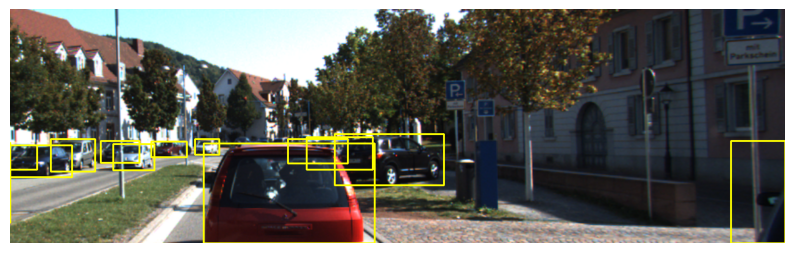

[[   0.       218.5019    43.16273  257.39026]
 [ 310.04004  215.97552  584.50903  375.     ]
 [1155.953    211.54033 1242.       375.     ]
 [ 520.0559   200.95477  695.6681   282.70963]
 [ 475.844    205.9241   581.47345  257.40707]
 [ 445.9219   208.81967  541.0882   247.68903]
 [ 165.86885  216.00388  231.28552  258.15436]
 [   0.       235.69406    0.       342.44833]
 [ 296.06143  208.07324  335.87512  233.58986]
 [   0.       218.98045   99.52839  269.91263]
 [  65.97531  208.6926   136.85025  260.3281 ]
 [ 145.58539  211.32144  207.86101  246.09846]
 [ 226.70203  212.29907  283.84283  237.18478]
 [   0.       216.42328    0.       268.8611 ]
 [   0.       214.89072    0.       253.5859 ]]
----------------------------------------------------------------------------------------------------


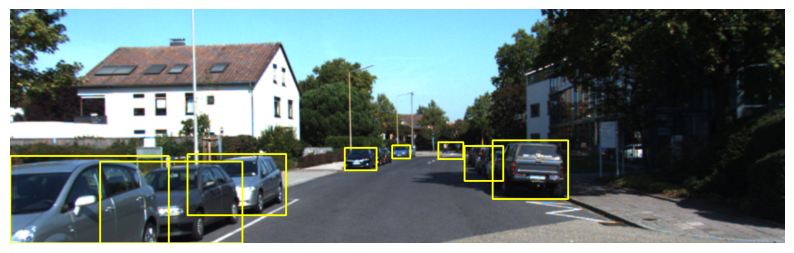

[[686.97314 213.47804 726.377   240.61546]
 [728.46375 219.0315  790.2064  275.6393 ]
 [  0.      256.68735   0.      375.     ]
 [  0.      235.84192 254.77887 375.     ]
 [773.7405  210.81299 894.14813 304.85248]
 [144.04968 244.81905 372.05362 375.     ]
 [284.17615 232.71764 442.20175 330.16205]
 [536.3483  222.68582 587.6408  258.39737]
 [612.9119  218.04288 641.6583  239.79828]]
----------------------------------------------------------------------------------------------------


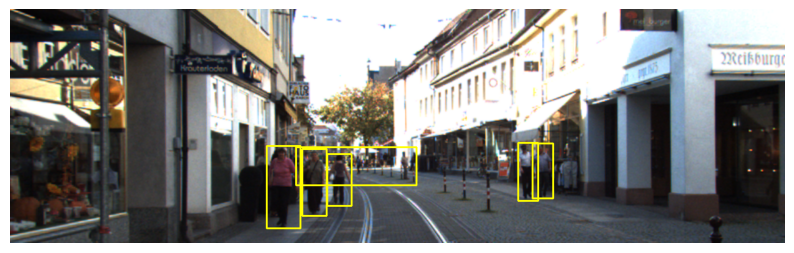

[[458.5967  221.79391 651.21387 282.70993]
 [508.0574  232.55002 547.5994  315.99704]
 [411.4728  219.52655 465.30707 351.22412]
 [468.7316  224.90605 507.32077 331.23666]
 [814.1407  214.11696 846.0601  307.0059 ]
 [837.3417  215.4004  870.6903  303.28156]]
----------------------------------------------------------------------------------------------------


In [3]:
for i in range(3):
    
    img_path = selected_labels[i]['image_path']
    objCategoryid = selected_labels[i]['classid']
    boundingBox2D = selected_labels[i]['bbox'].copy()

    image_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    new_img, bboxes = scaled_random_crop(
        img=image_rgb, 
        bboxes=boundingBox2D, 
        scale=0.7)

    draw_bbox_on_img_data(new_img, bboxes, figsize=(10,8))
    print(bboxes)
    print('-' * 100)

## Resize with padding

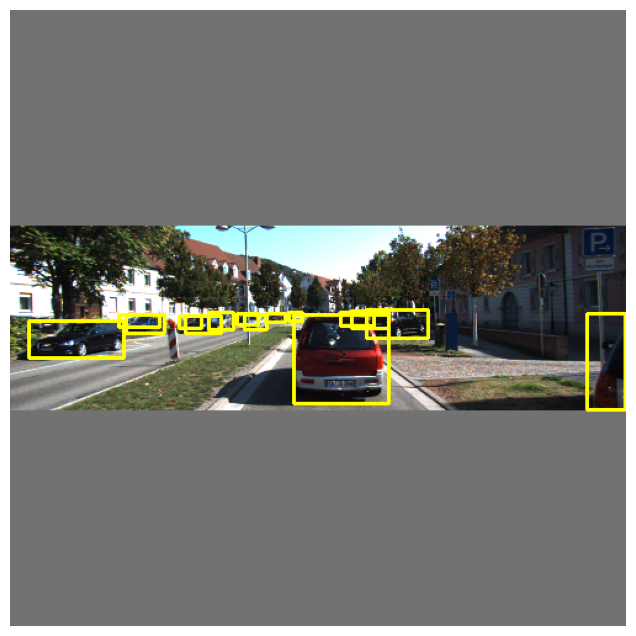

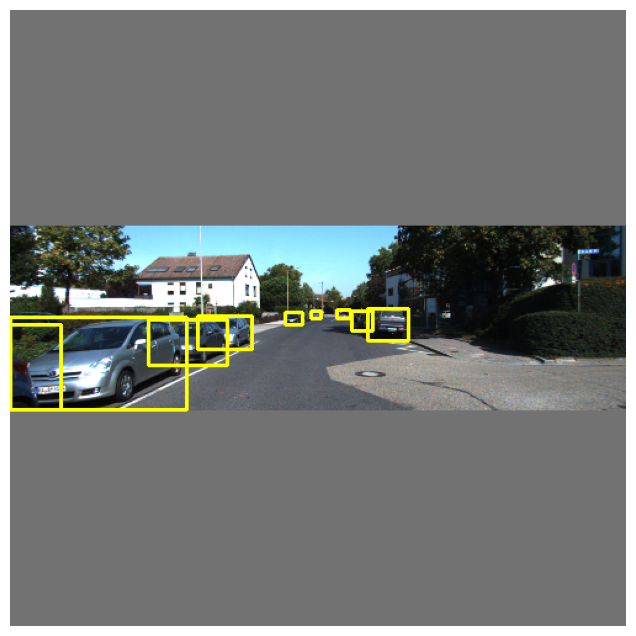

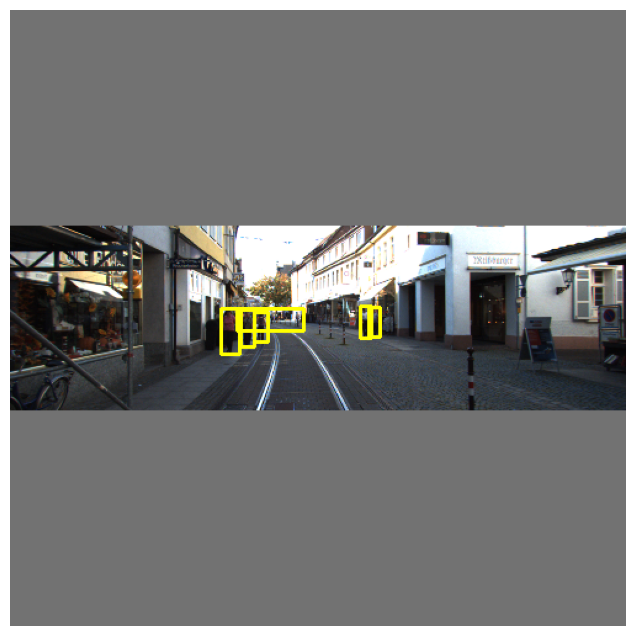

In [4]:
img_new_h = 500
img_new_w = 500

for i in range(3):
    img_path = selected_labels[i]['image_path']
    objCategoryid = selected_labels[i]['classid']
    boundingBox2D = selected_labels[i]['bbox'].copy()

    image_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    new_img, bboxes = resize_with_padding(
        img=image_rgb, 
        bboxes=boundingBox2D, 
        img_h=img_new_h, 
        img_w=img_new_w)
    draw_bbox_on_img_data(new_img, bboxes, figsize=(10,8))

## Resize with warping

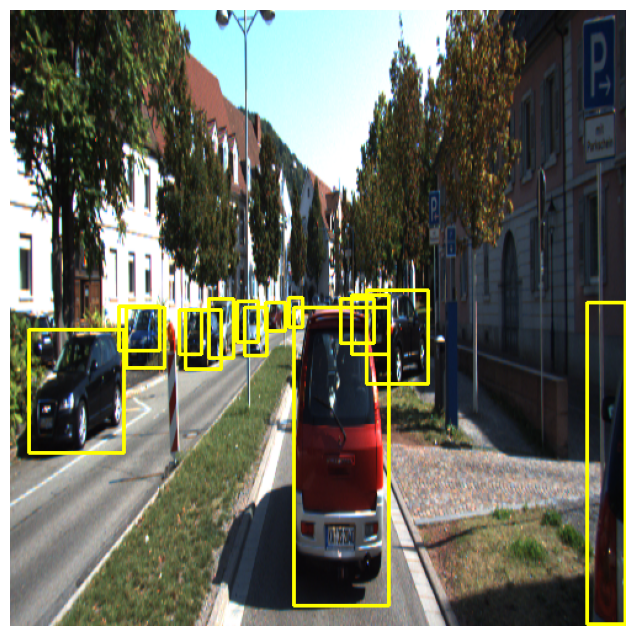

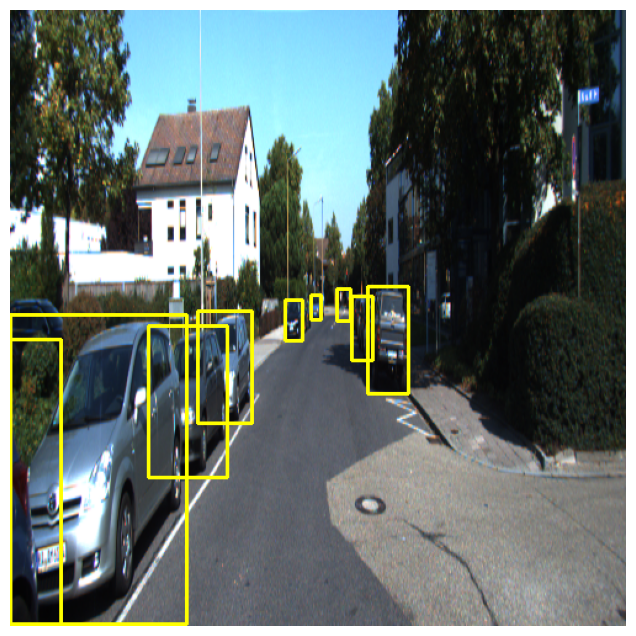

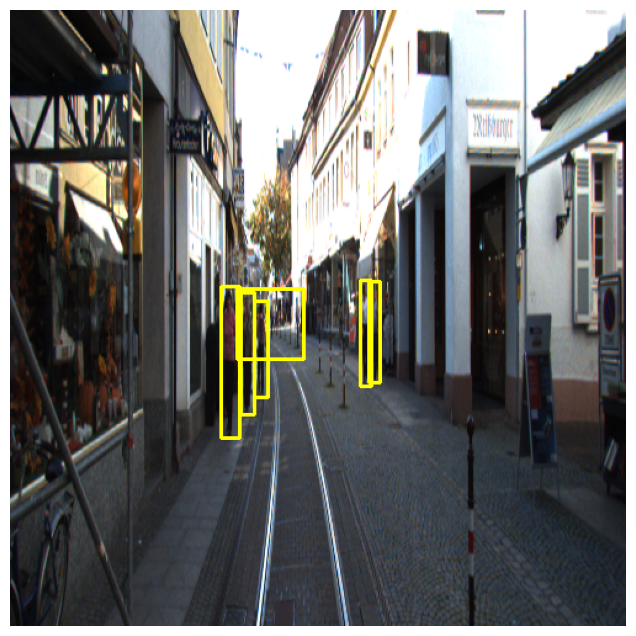

In [5]:
img_new_h = 500
img_new_w = 500

for i in range(3):
    img_path = selected_labels[i]['image_path']
    objCategoryid = selected_labels[i]['classid']
    boundingBox2D = selected_labels[i]['bbox'].copy()

    image_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    new_img, bboxes = resize_with_warping(
        img=image_rgb, 
        bboxes=boundingBox2D, 
        img_h=img_new_h, 
        img_w=img_new_w)
    draw_bbox_on_img_data(new_img, bboxes, figsize=(10,8))

## Horizontally Flip Image

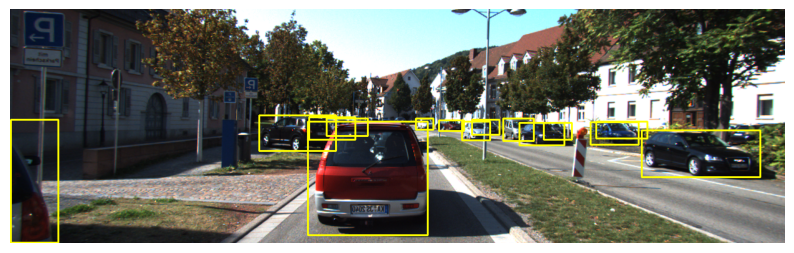

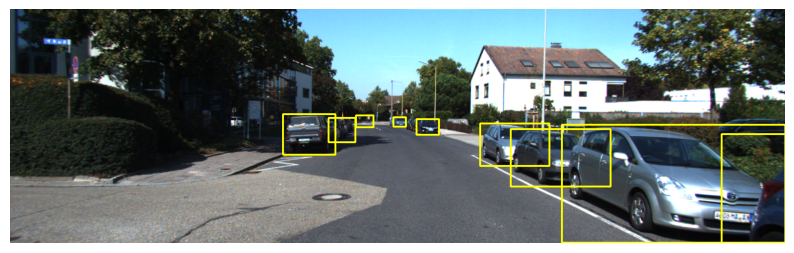

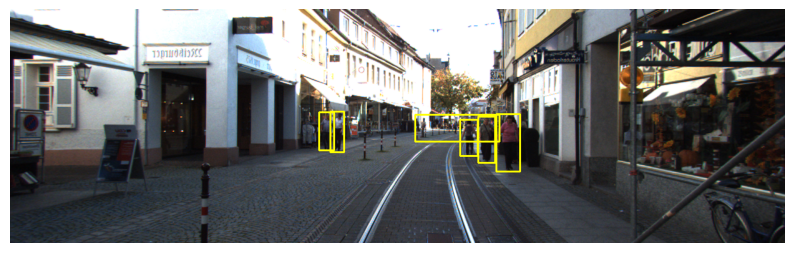

In [6]:
for i in range(3):
    img_path = selected_labels[i]['image_path']
    objCategoryid = selected_labels[i]['classid']
    boundingBox2D = selected_labels[i]['bbox'].copy()

    image_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    new_img, bboxes = flip_image(
        image=image_rgb, 
        bboxes=boundingBox2D)
    draw_bbox_on_img_data(new_img, bboxes, figsize=(10,8))

## Random Perspective Transform

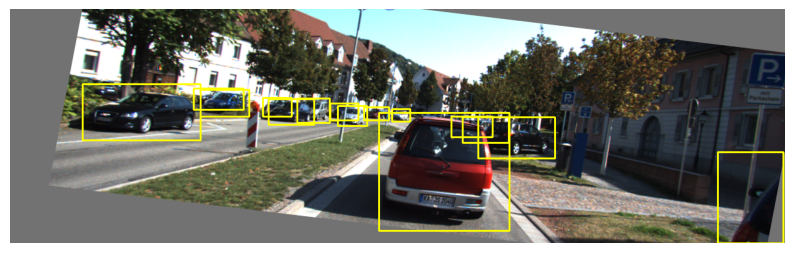

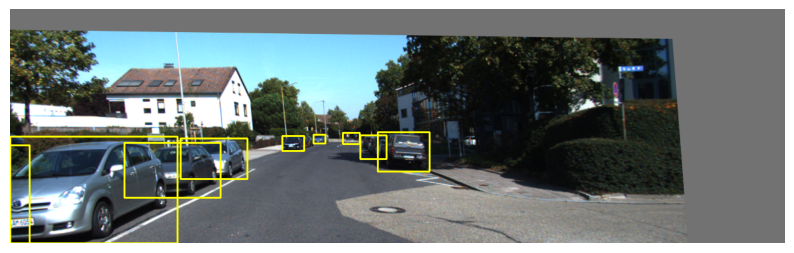

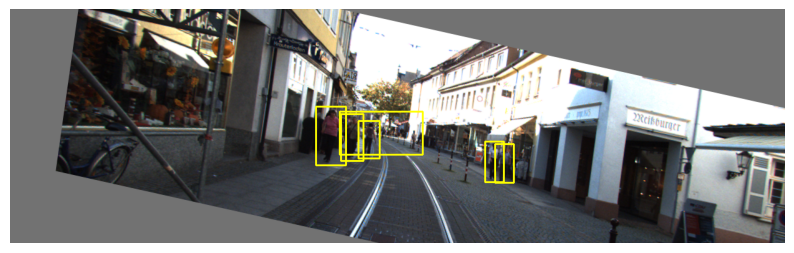

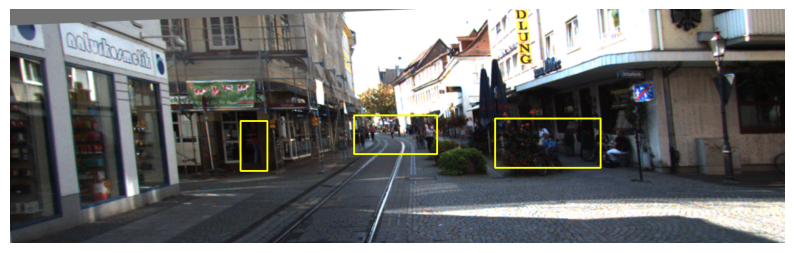

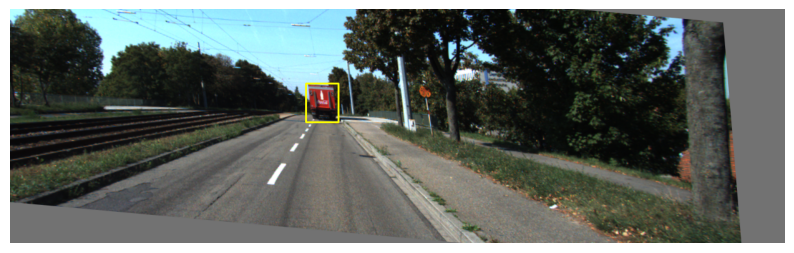

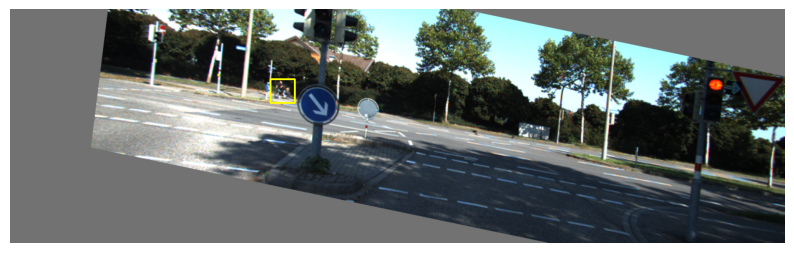

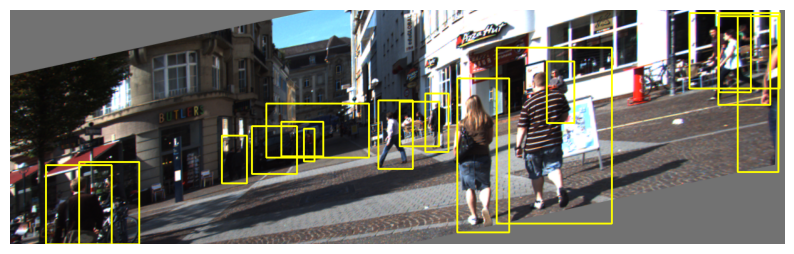

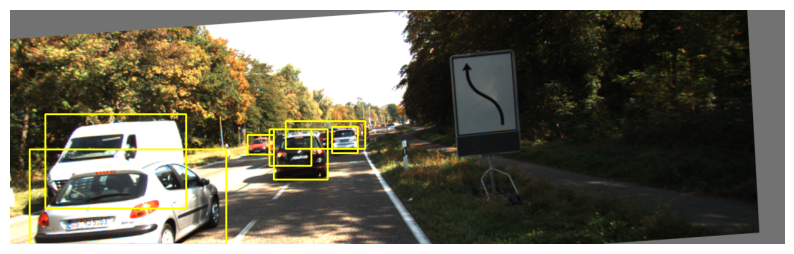

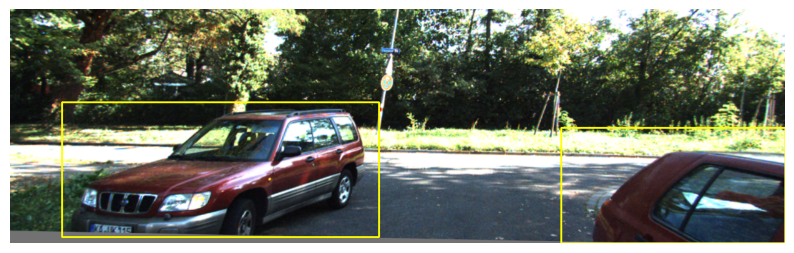

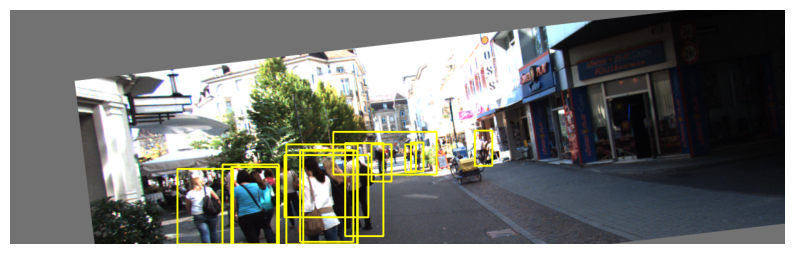

In [7]:
for i in range(10):
    img_path = selected_labels[i]['image_path']
    objCategoryid = selected_labels[i]['classid']
    boundingBox2D = selected_labels[i]['bbox'].copy()

    image_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    new_img, T, height, width = random_perspective(image_rgb)
    bboxes = geometric_transform_bbox(boundingBox2D, T, height, width)
    draw_bbox_on_img_data(new_img, bboxes, figsize=(10,8))

